Estimado candidato,

Estamos encantados de que estés considerando unirte a nuestro equipo de ciencia de datos. Como parte de nuestro proceso de evaluación, te pedimos que completes la siguiente prueba técnica.

**Descripción de la tarea:**

Se te proporciona un conjunto de datos anónimos que consta de varias columnas nombradas como 'col1', 'col2', 'col3', etc., hasta 'col20', y una columna 'target' que representa la variable objetivo. Tu tarea es realizar un análisis exploratorio de datos (EDA) y construir un modelo de aprendizaje automático para predecir la variable 'target'.

**Detalles de la tarea:**

1. **Análisis exploratorio de datos (EDA):** Realiza un análisis exploratorio detallado de los datos. Esto debe incluir, pero no está limitado a:
   - Estadísticas descriptivas de las variables (mínimo, máximo, media, mediana, desviación estándar, etc.).
   - Verificación de valores perdidos o anómalos.
   - Análisis de correlación entre las variables.
   - Visualizaciones para entender mejor las distribuciones y relaciones de los datos.

2. **Preprocesamiento de datos:** Prepárate para realizar cualquier limpieza o transformación necesaria de los datos basándote en tu EDA.

3. **Creación de un modelo de línea base (Baseline):** Entrena varios modelos de aprendizaje automático para predecir la variable 'target'. Comienza con modelos sencillos como la regresión logística y avanza hacia modelos más complejos como los árboles de decisión, random forest, SVM, XGBoost, etc.

4. **Evaluación del modelo:** Evalúa el rendimiento de cada modelo utilizando métricas apropiadas. Por ejemplo, si 'target' es una variable binaria, podrías considerar la precisión, la sensibilidad, la especificidad, el AUC-ROC, etc.

5. **Selección del modelo:** Selecciona el modelo que creas que funciona mejor. Justifica tu elección basándote en las métricas de evaluación y cualquier otra consideración pertinente.

6. **Predicción:** Usa tu modelo seleccionado para hacer predicciones en el conjunto de datos.

**Entregables:**

Por favor, proporciona el código que hayas utilizado para completar esta tarea, junto con un informe detallado que explique tu enfoque y los resultados. El informe debe estar bien estructurado y ser fácil de seguir, permitiendo a los evaluadores entender tu proceso de pensamiento y las decisiones que hayas tomado.

¡Buena suerte y esperamos ver tu solución!

In [148]:
# Tratamiento de datos
import pandas as pd
import numpy as np

# Preprocesado y modelado
from scipy.stats import shapiro
from scipy.stats import skew
from scipy.stats import norm
from sklearn.feature_selection import SelectKBest

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns



# Modelos
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.preprocessing import OneHotEncoder, StandardScaler,FunctionTransformer,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression,LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error,mean_absolute_error, r2_score

from sklearn.model_selection import GridSearchCV
from sklearn.tree import  DecisionTreeRegressor
from sklearn.ensemble import   RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import  GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from catboost import CatBoostClassifier
from xgboost import XGBRegressor 

from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings('ignore')

In [81]:
data = pd.read_csv(r'C:\Users\laura\OneDrive\Desktop\DS_PT_09_2023\Machine_Learning\Prueba_Tecnica_Nivel\data\test.csv')
df = data.copy()

In [82]:
def eda_info (df):
    print(df.shape)
    print('-------'*100)
    print('Columnas:',df.columns)
    print('-------'*100)
    print(df.info())
    print('-------'*100)
    print('DTypes:\n' ,df.dtypes)


In [83]:
eda_info(df)

(2399, 21)
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Columnas: Index(['ID', 'col1', 'col2', 'col3', 'col4', 'col5', 'col6', 'col7', 'col8',
       'col9', 'col10', 'col11', 'col12', 'col13', 'col14', 'col15', 'col16',
       'col17', 'col18', 'col19', 'col20'],
      dtype='object')
---------------------------------------------------------

In [84]:
df.describe()

,ID,col1,col2,col3,col4,col5,col6,col7,col8,col9,...,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20
count,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,...,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000,2399.000000
mean,4078.200500,0.646794,13.903456,0.156517,1.540459,0.042934,2.094756,0.238925,0.801942,0.784685,...,0.326404,0.097986,9.819208,1.325102,0.005188,16.101351,2.892601,0.049875,0.143043,0.043910
std,2300.446106,1.245658,8.934156,0.247822,1.204305,0.036003,2.532764,0.266264,0.656328,0.432865,...,0.379951,0.058554,5.449099,0.583812,0.002984,17.591092,2.312425,0.028652,0.142070,0.026843
min,6.000000,0.000000,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2085.000000,0.040000,6.155000,0.020000,0.560000,0.008000,0.090000,0.040000,0.090000,0.430000,...,0.002000,0.046000,5.240000,0.990000,0.003000,2.110000,0.800000,0.030000,0.040000,0.020000
50%,4129.000000,0.070000,13.640000,0.050000,1.170000,0.040000,0.490000,0.090000,0.750000,0.790000,...,0.008000,0.100000,10.130000,1.420000,0.005000,7.480000,2.390000,0.050000,0.080000,0.040000
75%,6090.000000,0.245000,21.820000,0.100000,2.420000,0.070000,4.045000,0.410000,1.380000,1.160000,...,0.710000,0.150000,14.350000,1.760000,0.008000,28.430000,4.665000,0.070000,0.230000,0.070000
max,7995.000000,5.030000,29.840000,1.050000,4.870000,0.130000,8.680000,0.900000,2.000000,1.500000,...,1.000000,0.200000,19.830000,2.930000,0.010000,59.740000,7.970000,0.100000,0.500000,0.090000


In [85]:
print(df.isnull().sum())
print('-----'*100)
print('Duplicated:', df.duplicated().sum())

ID       0
col1     0
col2     0
col3     0
col4     0
col5     0
col6     0
col7     0
col8     0
col9     0
col10    0
col11    0
col12    0
col13    0
col14    0
col15    0
col16    0
col17    0
col18    0
col19    0
col20    0
dtype: int64
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Duplicated: 0


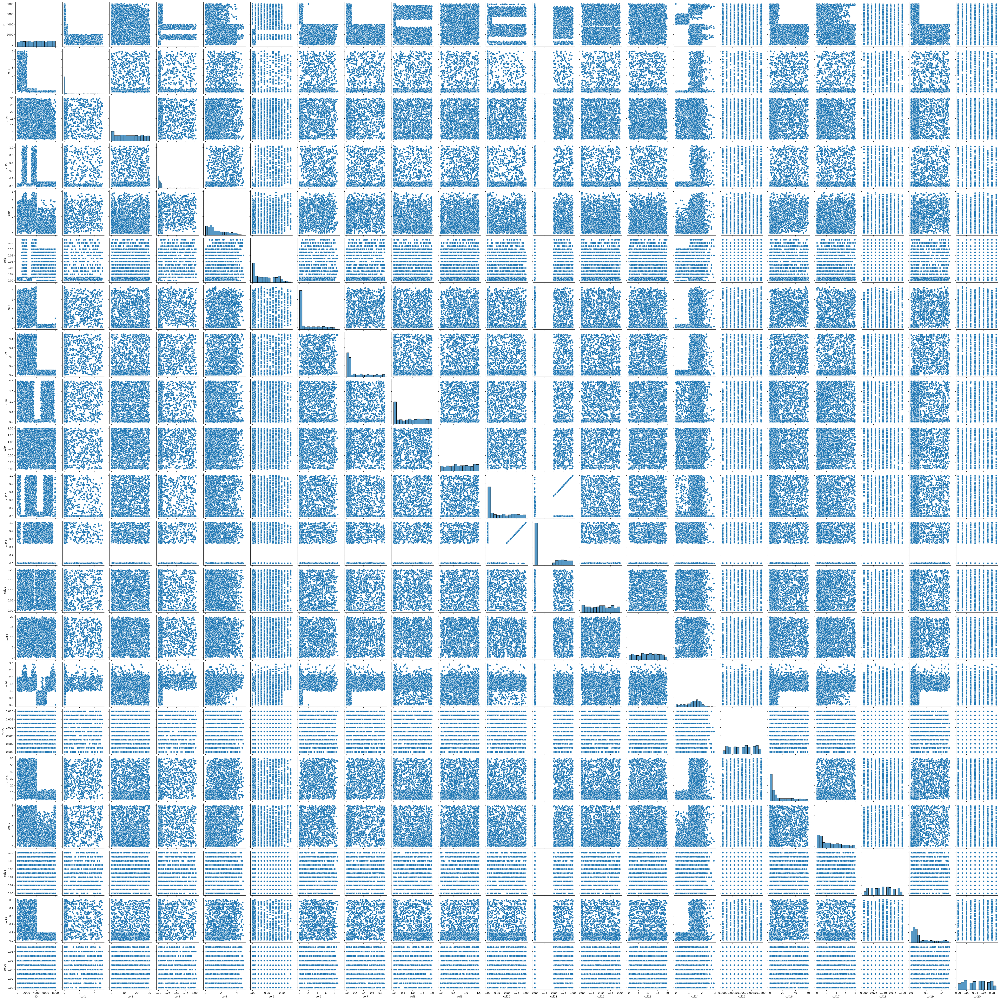

In [31]:
sns.pairplot(df)

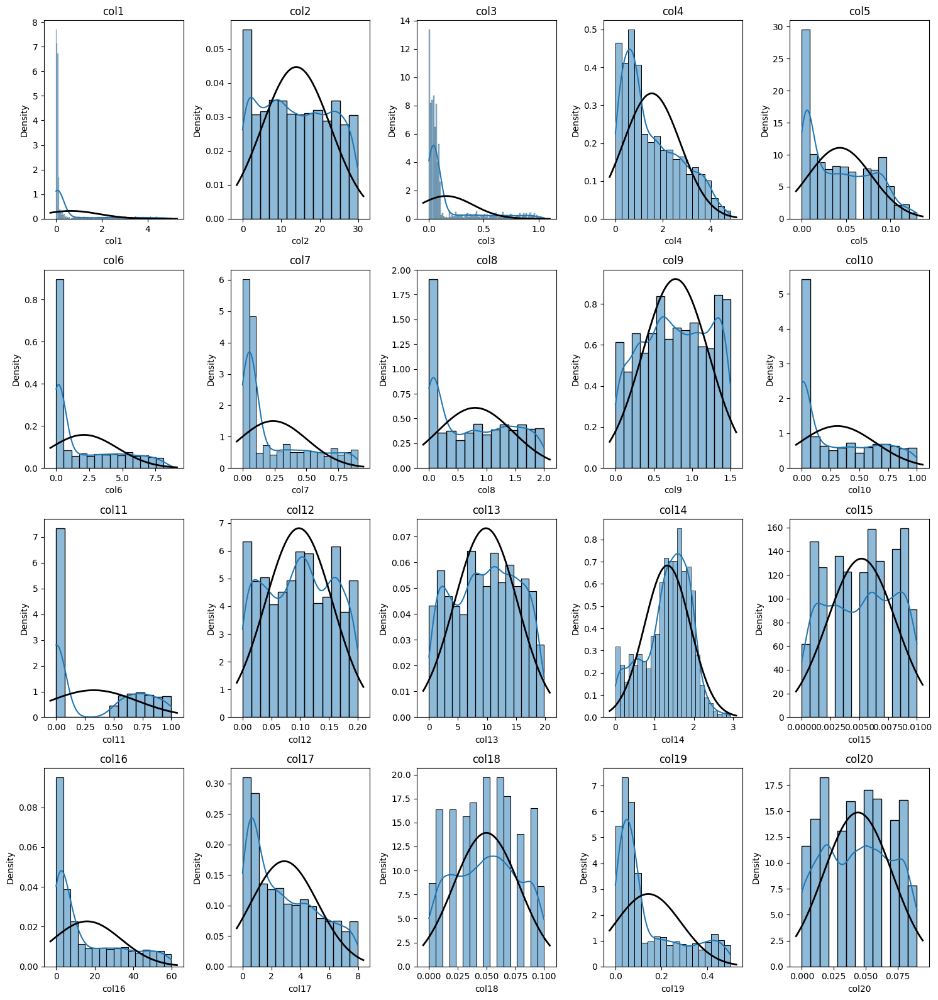

In [86]:
num_cols = len(X.columns)
num_rows = (num_cols + 4) // 5  # Calculamos el número de filas necesario

plt.figure(figsize=(15, 4 * num_rows))

for i, column in enumerate(X.columns):
    plt.subplot(num_rows, 5, i + 1)
    sns.histplot(X[column], kde=True, stat="density")

    mu, std = X[column].mean(), X[column].std()
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    plt.title(column)

plt.tight_layout()
plt.show()

### TRANSFORMACIONES ###

In [129]:
X = df.drop(columns='ID')
y= df['ID']

In [130]:
X.columns

Index(['col1', 'col2', 'col3', 'col4', 'col5', 'col6', 'col7', 'col8', 'col9',
       'col10', 'col11', 'col12', 'col13', 'col14', 'col15', 'col16', 'col17',
       'col18', 'col19', 'col20'],
      dtype='object')

In [ ]:
# col_log = ['col1', 'col3', 'col4', 'col5', 'col6', 'col7','col10', 'col6', 'col7', 'col9']

# pipeline = make_pipeline(
#     ColumnTransformer(
#         transformers=[
#             ('log', FunctionTransformer(np.log1p, validate=True), col_log)  # Aplica logaritmo
#         ],
#         remainder='passthrough'  # Mantén las columnas no especificadas
#     ),
#     MinMaxScaler()  # Estandarizar todo el DataFrame
# )

# # Aplica el pipeline al DataFrame
# X_transformado = pipeline.fit_transform(X)

In [133]:
col_log = ['col1', 'col3', 'col4', 'col5', 'col6', 'col7','col10', 'col16', 'col17', 'col19']

pipeline = make_pipeline(
    ColumnTransformer(
        transformers=[
            ('log', FunctionTransformer(np.log1p, validate=True), col_log)  # Aplica logaritmo
        ],
        remainder='passthrough'  # Mantén las columnas no especificadas
    ),
    MinMaxScaler()  # Estandarizar todo el DataFrame
)


# Aplica el pipeline al DataFrame
X_transformado = pipeline.fit_transform(X)


In [134]:
X_transf = pd.DataFrame(X_transformado)
X_transf.columns = X.columns
X_transf.to_csv(r'C:\Users\laura\OneDrive\Desktop\DS_PT_09_2023\Machine_Learning\Prueba_Tecnica_Nivel\data\X_transf.csv', sep=',')
print(X_transf.describe())

                0            1            2            3            4   \
count  2399.000000  2399.000000  2399.000000  2399.000000  2399.000000   
mean      0.179775     0.177003     0.464556     0.339134     0.356964   
std       0.290074     0.252515     0.265592     0.280409     0.345375   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.021829     0.027586     0.251256     0.065197     0.037963   
50%       0.037656     0.067968     0.437735     0.320909     0.175668   
75%       0.121958     0.132774     0.694769     0.553592     0.712931   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

                5            6            7            8            9   \
count  2399.000000  2399.000000  2399.000000  2399.000000  2399.000000   
mean      0.301656     0.344939     0.527389     0.531076     0.312067   
std       0.307689     0.349460     0.307879     0.293182     0.289766   
min       0.000000     0.000000     0

In [135]:
X_transf.columns = X.columns

In [136]:
X_transf.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20
0,0.032430,0.054637,0.022160,0.008178,0.796581,0.966850,0.695994,0.190888,0.990760,0.882134,0.844251,0.615,0.346667,0.620,0.110,0.636914,0.658703,0.3,0.4,0.111111
1,0.047963,0.680625,0.630075,0.853887,0.905440,0.941516,0.790772,0.968181,0.315945,0.279503,0.922126,0.045,0.806667,0.730,0.005,0.226425,0.665529,0.9,1.0,0.111111
2,0.047963,0.094253,0.309699,0.399207,0.041986,0.015502,0.389567,0.507580,0.146810,0.120331,0.039439,0.720,0.946667,0.007,0.885,0.051942,0.433447,0.2,0.6,0.666667
3,0.037656,0.054637,0.450606,0.241854,0.065381,0.046052,0.000000,0.200695,0.187845,0.072901,0.378008,0.590,0.586667,0.001,0.160,0.205245,0.334471,0.3,0.6,0.777778
4,0.005538,0.013861,0.620736,0.000000,0.483957,0.000000,0.000000,0.000000,0.000000,0.000000,0.336898,0.045,0.000000,0.000,0.000,0.000000,0.000000,0.0,0.0,0.000000


### MODELOS ###

In [137]:
X_train, X_test, y_train, y_test = train_test_split(X_transf, y, test_size=0.2, random_state=42)

In [10]:
# BASELINE -- CROSSVAL + GRIDSEARCH 
# modelos de regresion ya que la target es continu

In [138]:
modelos = {
    "LinearRegression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Elastic Net": ElasticNet(),
    "SVR": SVR(),
    "kNN": KNeighborsRegressor(),
    'DTree': DecisionTreeRegressor(),
    "RandomForest": RandomForestRegressor(),
    "XgB": XGBRegressor()

}
resultados = {}

for modelo in modelos:
    resultados[modelo]=[cross_val_score(modelos[modelo], X_train, y_train, cv=5, scoring="r2").mean()]

print(pd.DataFrame(resultados).T)

                         0
LinearRegression  0.827331
Ridge             0.827355
Lasso             0.827552
Elastic Net       0.489453
SVR               0.067728
kNN               0.875191
DTree             0.946317
RandomForest      0.968766
XgB               0.964665


In [140]:
from sklearn.decomposition import PCA
pca = PCA(0.95)
X95 = pca.fit_transform(X_train)

In [142]:
modelos = {
      "LinearRegression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Elastic Net": ElasticNet(),
    "SVR": SVR(),
    "kNN": KNeighborsRegressor(),
    'DTree': DecisionTreeRegressor(),
    "RandomForest": RandomForestRegressor(),
    "XgB": XGBRegressor(),
}
resultados = {}

for modelo in modelos:
    resultados[modelo]=[cross_val_score(modelos[modelo], X95, y_train, cv=5, scoring="r2").mean()]

result = pd.DataFrame(resultados).T


                         0
LinearRegression  0.798771
Ridge             0.798797
Lasso             0.798818
Elastic Net       0.486910
SVR               0.065819
kNN               0.862572
DTree             0.797883
RandomForest      0.900736
XgB               0.894282


In [145]:
linear_params = {
    'fit_intercept': [True, False],
    'copy_X': [True, False]
}

In [146]:
model = GridSearchCV(LinearRegression(), linear_params, cv=5, scoring="neg_mean_absolute_error", verbose=1, n_jobs=-1)
model.fit(X95, y_train)

best_model = model.best_estimator_
best_parameters = model.best_params_

print(best_model)
print('---'*200)
print(best_parameters)
print('---'*200)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
LinearRegression()
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
{'copy_X': True, 'fit_intercept': True}
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [150]:
model = LinearRegression(copy_X=True, fit_intercept=True)
model.fit(X_train, y_train)
y_pred = model.predict(X_train)
print('R2:', r2_score(y_train, y_pred))
print('MAE:', mean_absolute_error(y_train, y_pred))
print('MSE:', mean_squared_error(y_train, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_train, y_pred)))


R2: 0.8316767412295616
MAE: 748.7414243022843
MSE: 889447.6639481811
RMSE: 943.1053302511767
